# Look at accelerometer data 

From Jeep and Focus at various speeds over various potholes and storm drain channels.

In [1]:
#Standard Header used on the projects

#first the major packages used for math and graphing
import numpy as np
import matplotlib.pyplot as plt
from cycler import cycler
import scipy.special as sp
import pandas as pd

#Custome graph format style sheet
plt.style.use('Prospectus.mplstyle')

#If being run by a seperate file, use the seperate file's graph format and saving paramaeters
#otherwise set what is needed
if not 'Saving' in locals():
    Saving = False
if not 'Titles' in locals():
    Titles = True
if not 'Ledgends' in locals():
    Ledgends = True
if not 'FFormat' in locals():
    FFormat = '.png'
if not 'location' in locals():
    #save location.  First one is for running on home PC, second for running on the work laptop.  May need to make a global change
    #location = 'E:\\Documents\\Dan\\Code\\Prospectus\\Document\\Figures\\'
    #location = 'C:\\Users\\dhendrickson\\Documents\\github\\FigsAndPlots\\FigsAndPlotsDocument\\Figures\\'
    location = 'E:\\Documents\\Dan\\Phd\\Play\\'

#Standard cycle for collors and line styles
default_cycler = (cycler('color', ['0.00', '0.40', '0.60', '0.70']) + cycler(linestyle=['-', '--', ':', '-.']))
plt.rc('axes', prop_cycle=default_cycler)

In [2]:
#Extra Headers:
import DWFT as fp
import os as os
import pywt as py
my_cmap = plt.get_cmap('gray')

In [3]:
#DataSet = np.genfromtxt(open('./Data/Jeep SD 10.txt','r'), delimiter=',',skip_header=4)
Header = np.array(['T', 'X','Y','Z','R','Theta','Phi'])

In [4]:
def PlotFingerPrint(data, xName='a', title='', FP='mexh'):
    FpScat = fp.getLabeledThumbprint(data, FP)
    if xName == 'a':
        xName = np.arange(0,np.shape(data)[0],1)
    Al,Ms  = np.meshgrid(xName,np.linspace(1,50,50))

    fig1 = plt.figure(figsize=(6.67,3.75))
    ax1 = plt.axes()
    cs1 = ax1.contourf(Al,Ms, FpScat,cmap=my_cmap,levels=10)

    if Titles: plt.title(title)
    if Saving: plt.savefig(location+title.replace(" ", "").replace(":", "").replace(",", "").replace(".txt","")+FFormat)

    plt.show()

In [32]:
def PlotRunFP(dataSet, Order, Dimm, start = 0, end = 0):
    
    pointer = Order * 3 + Dimm

    if end == 0:
        end = np.shape(dataSet[pointer][2])[1]
    
    FpScat = dataSet[pointer][2][:,start:end]
    
    xName = np.arange(0,end-start,1)
    Al,Ms  = np.meshgrid(xName,np.linspace(1,50,50))

    fig1 = plt.figure(figsize=(6.67,3.75))
    ax1 = plt.axes()
    
    cs1 = ax1.contourf(Al,Ms, FpScat,cmap=my_cmap,levels=10)

    if Titles: plt.title(title)
    if Saving: plt.savefig(location+title.replace(" ", "").replace(":", "").replace(",", "").replace(".txt","")+FFormat)

    plt.show()

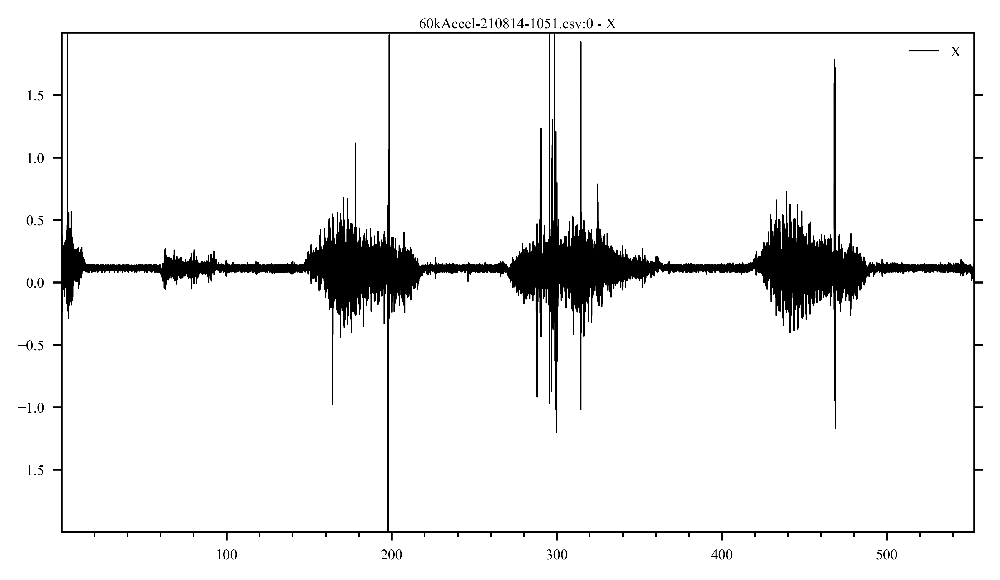

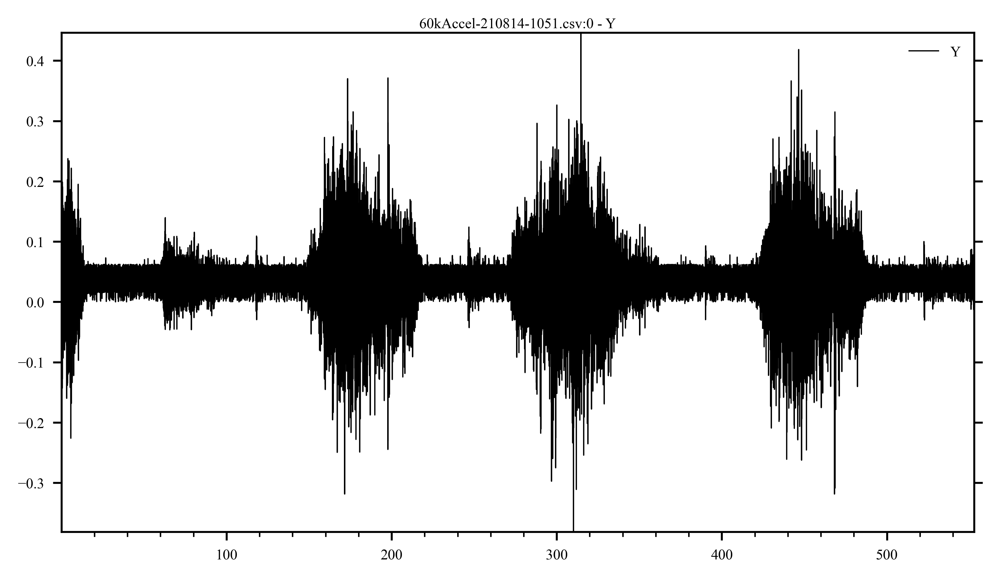

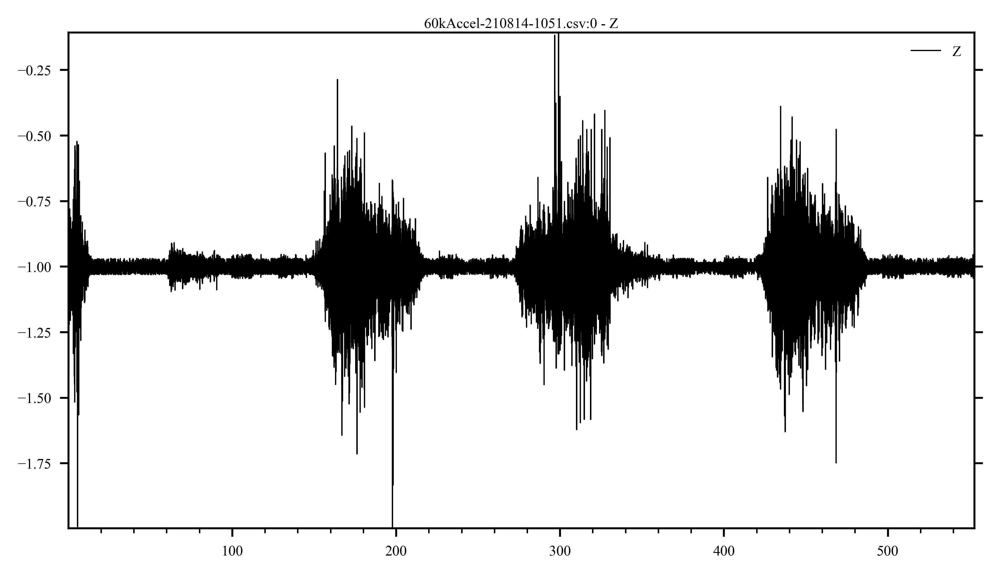

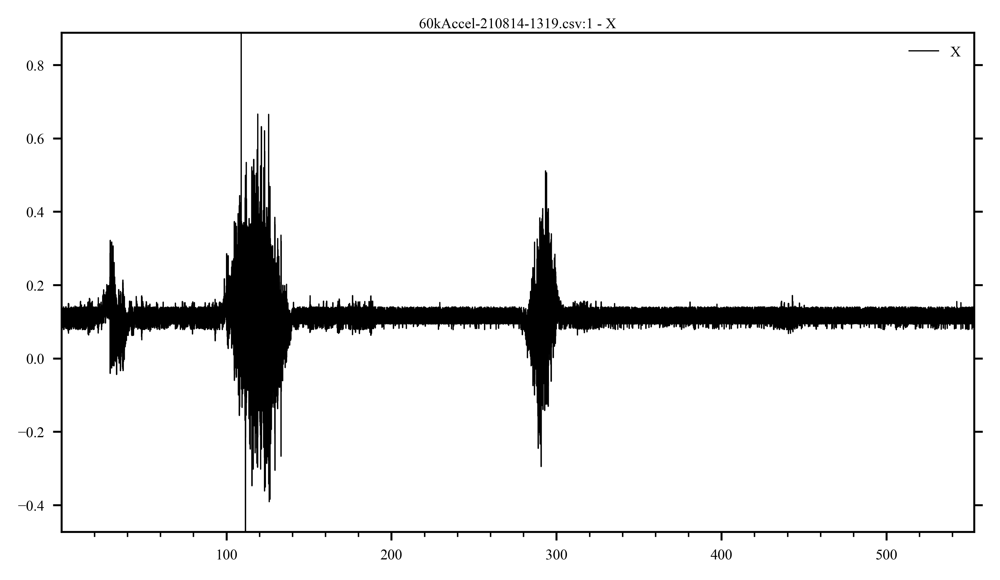

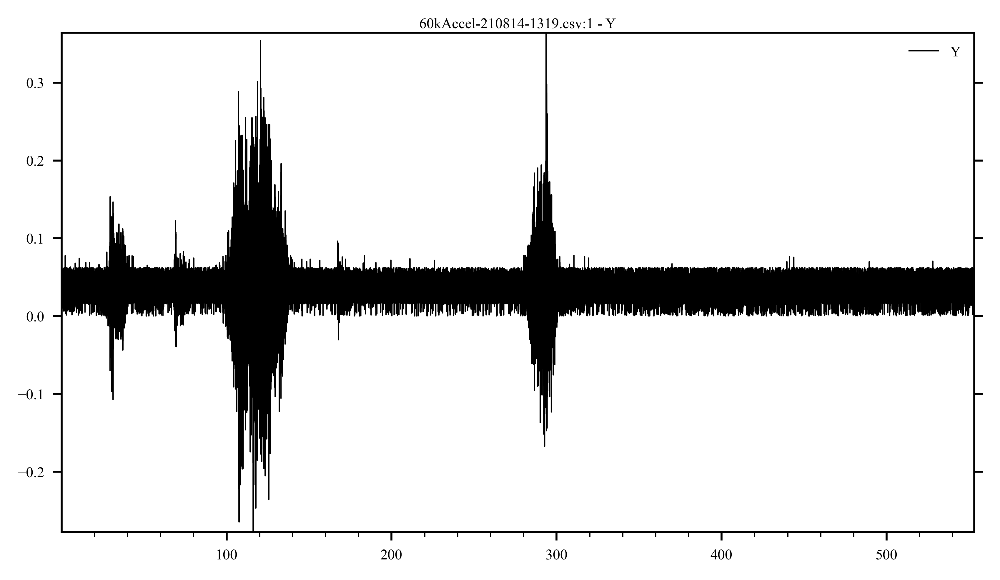

...

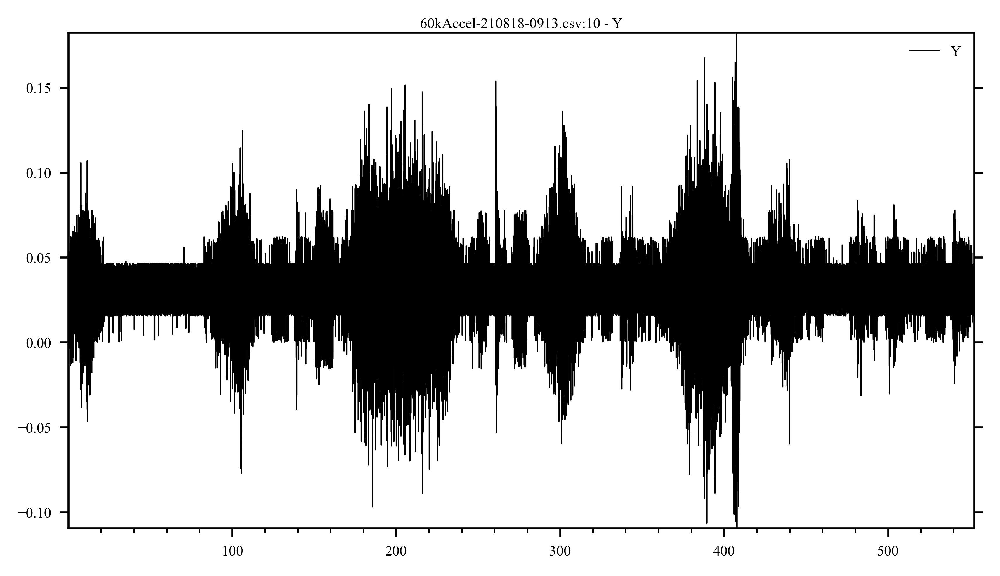

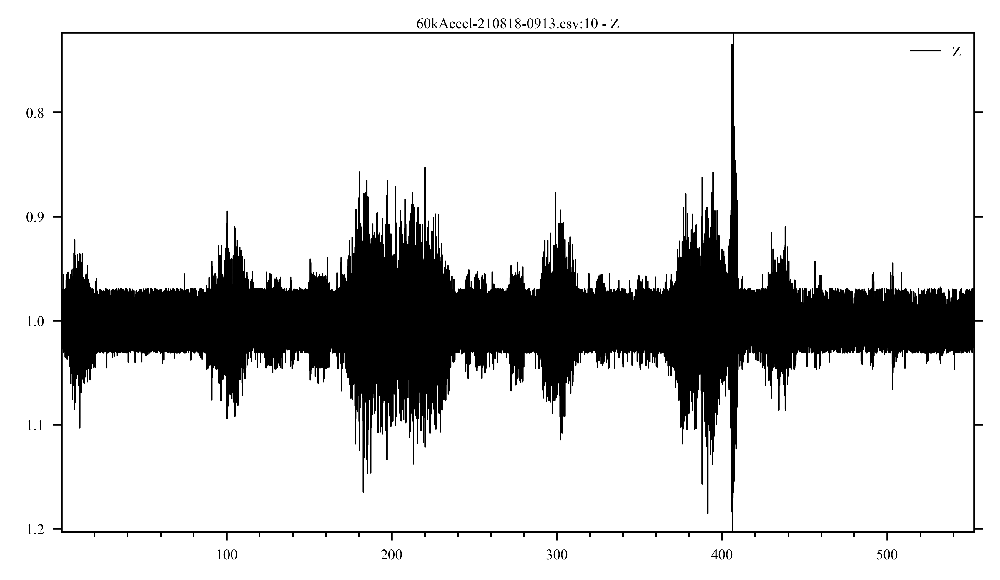

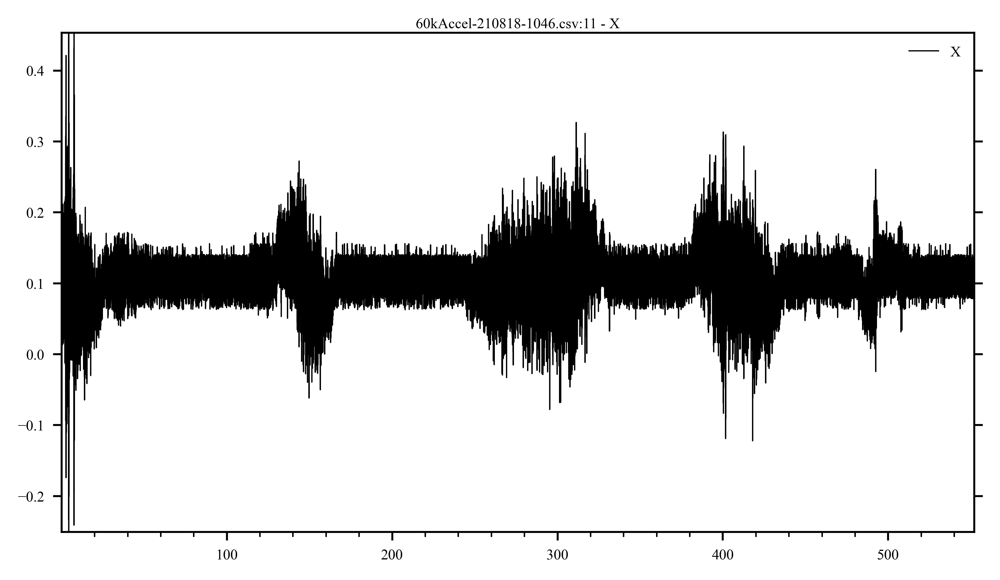

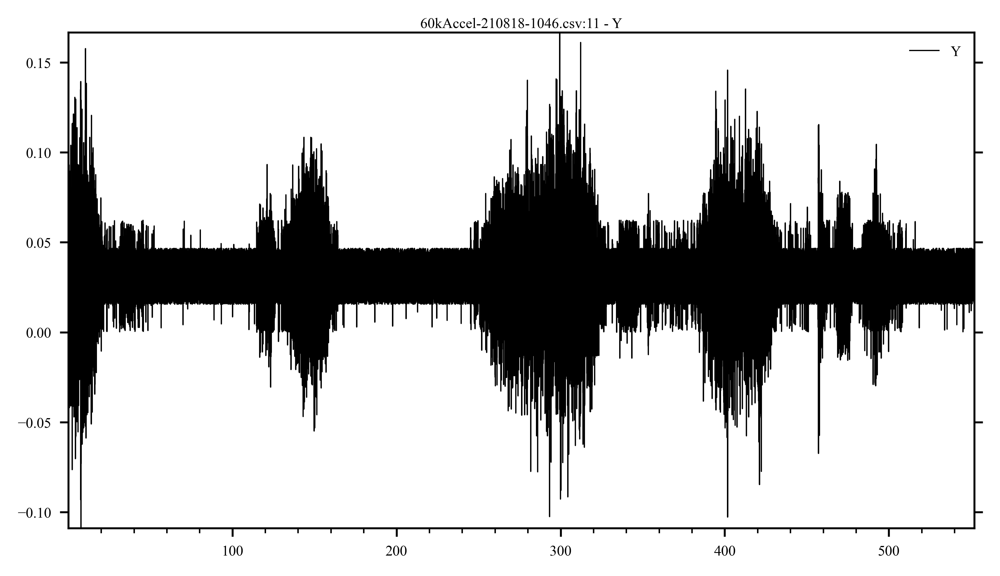

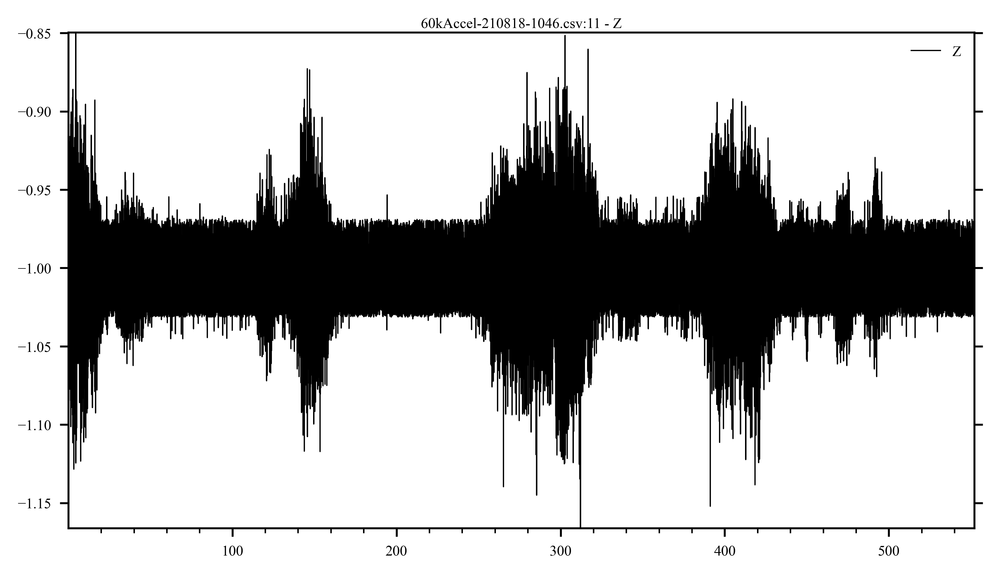

In [34]:
# Directory = './Data'
Directory = 'C:\\Users\\Hendrickson\\Desktop\\Phone Acceleration\\2\\'
files = os.listdir(Directory)
start = 0
end = 60000

size = 5000

j = 0

Results =[]

for Filename in files:
    DataSet = np.genfromtxt(open(Directory+'/'+Filename,'r'), delimiter=',',skip_header=4)
    DataSet = DataSet[:,1:5]
    length = np.shape(DataSet)[0]

    subResults = []

    #for i in range(int(length/size)):
    for i in range(3):
        coord = i+1
        fig=plt.figure(figsize=(6.67,3.75))
        plt.plot(DataSet[:,0][start:end], DataSet[:,coord][start:end], label = Header[coord])
        
        title = Filename + ':' + str(j) + ' - ' + Header[coord]
        if Ledgends: plt.legend()
        if Titles: plt.title(title)
        if Saving: plt.savefig(location+title.replace(" ", "").replace(":", "").replace(",", "")+FFormat)
        plt.show()
        
        ThPrint = fp.getLabeledThumbprint(DataSet[:,coord][start:end], 'coif1')

        subResults.append([i,ThPrint])
    Results.append([j,subResults])
    j = j+1

In [19]:
np.shape(results[1][2])[1]

59996

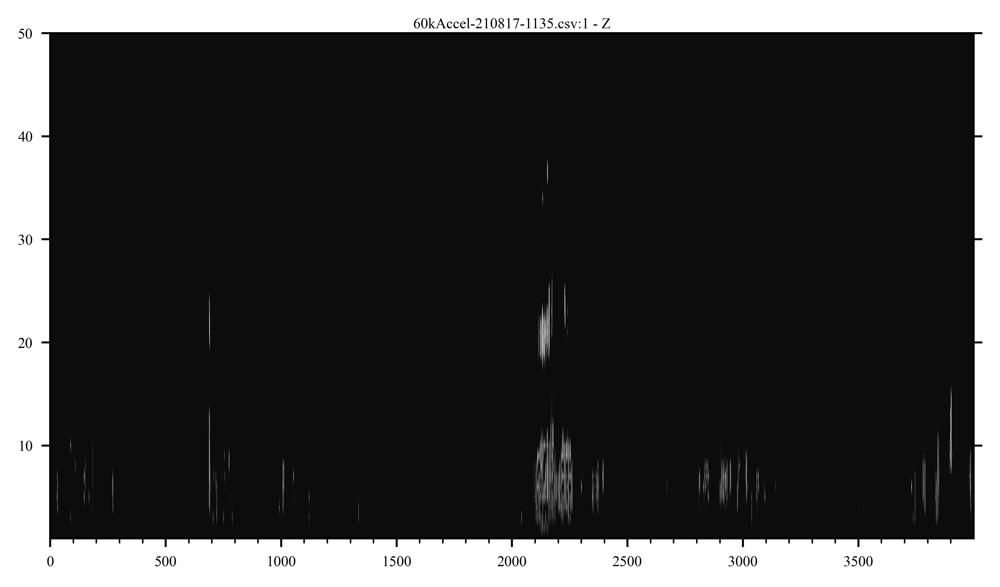

In [33]:
PlotRunFP(results, 1, 0, 16000, 20000)